# Functions

In [1]:
import os
import time
from pathlib import Path

import torch
import cv2
import pandas as pd
import numpy as np

repo_dir = Path().resolve()
data_path = repo_dir / "datasets/bags_historical"
os.environ["CUDA_VISIBLE_DEVICES"]="1"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_reserved(0)/1024**3,1), 'GB')

Using device: cuda
NVIDIA GeForce RTX 2080 Ti
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


In [2]:
def compute_errors(gt, pred):
    """Computation of error metrics between predicted and ground truth depths
    """
    thresh = np.maximum((gt / pred), (pred / gt))
    a1 = (thresh < 1.25     ).mean()
    a2 = (thresh < 1.25 ** 2).mean()
    a3 = (thresh < 1.25 ** 3).mean()

    rmse = (gt - pred) ** 2
    rmse = np.sqrt(rmse.mean())

    rmse_log = (np.log(gt) - np.log(pred)) ** 2
    rmse_log = np.sqrt(rmse_log.mean())

    abs_rel = np.mean(np.abs(gt - pred) / gt)

    sq_rel = np.mean(((gt - pred) ** 2) / gt)

    return abs_rel, sq_rel, rmse, rmse_log, a1, a2, a3

In [3]:
import matplotlib.pyplot as plt
from PIL import Image

def plot_data(data, title=""):
    plt.figure(figsize=(12, 8))
    plt.imshow(data)
    plt.title(title, fontsize=22)
    plt.show()

# Dataset 

## Visualising

In [4]:
markup = pd.read_csv(data_path / "markup.csv")
data = markup[markup.depth_fname.notna()]
data.sample(3)

,image,depth_fname,annotation,id,split,segmentation,detection,depth
2191,images/ckad_01_ckad_2020-10-29-16-53-38_0_1603...,depth/ckad_01_ckad_2020-10-29-16-53-38_0_16039...,annotations/ckad_01_ckad_2020-10-29-16-53-38_0...,2191,train,2.2,NaN,0.1
2910,images/ipcp_03_2020-08-19_ipcp_2020-08-19-20-2...,depth/ipcp_03_2020-08-19_ipcp_2020-08-19-20-23...,annotations/ipcp_03_2020-08-19_ipcp_2020-08-19...,2910,test,2.2,NaN,0.1
1059,images/ipcp_03_2020-08-19_ipcp_ipcp_n1-03_2020...,depth/ipcp_03_2020-08-19_ipcp_ipcp_n1-03_2020-...,annotations/ipcp_03_2020-08-19_ipcp_ipcp_n1-03...,1059,val,2.2,1.1,0.1


In [5]:
scenes = []
for row in data.itertuples():
    scene = row.image.rsplit("_", maxsplit=2)[0].split("/")[1]
    scenes.append(scene)
    
data["scene"] = scenes

/home/dvkorshunov/miniconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


ckad_01_ckad_2020-10-29-16-53-38_0 - 191


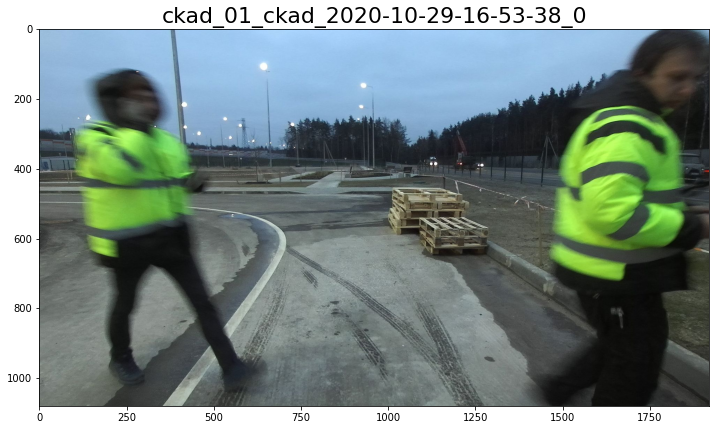

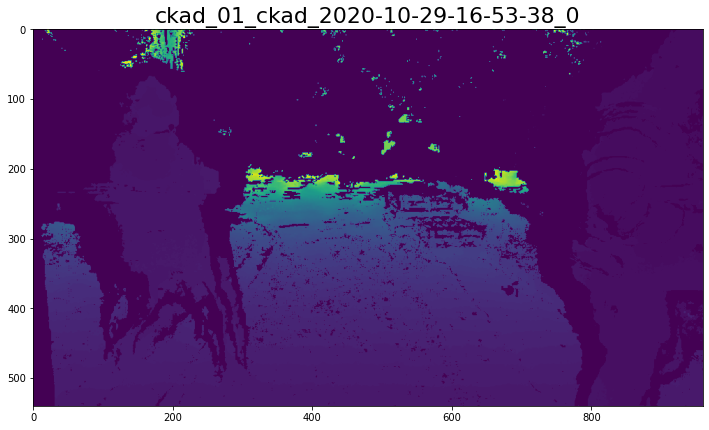

ckad_01_ckad_2020-10-29-17-01-56_0 - 127


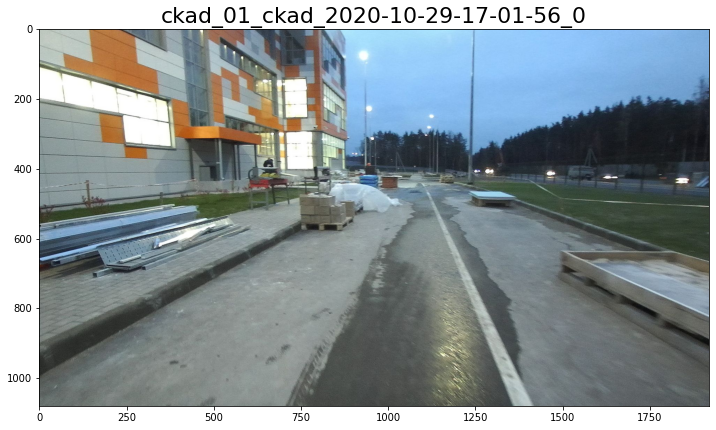

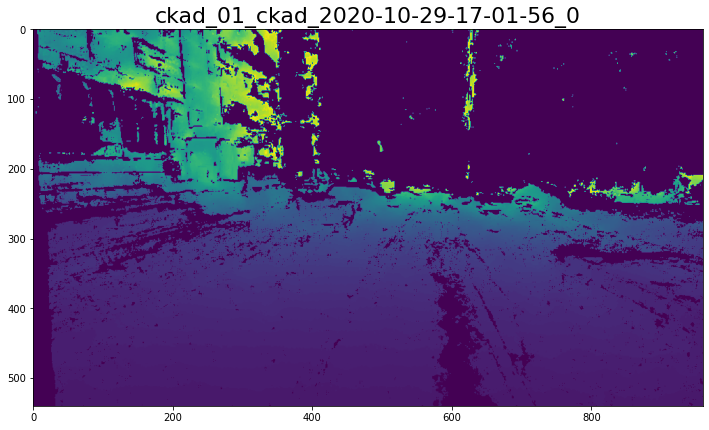

hospital_01_2020-07-14-14-03-23_0 - 147


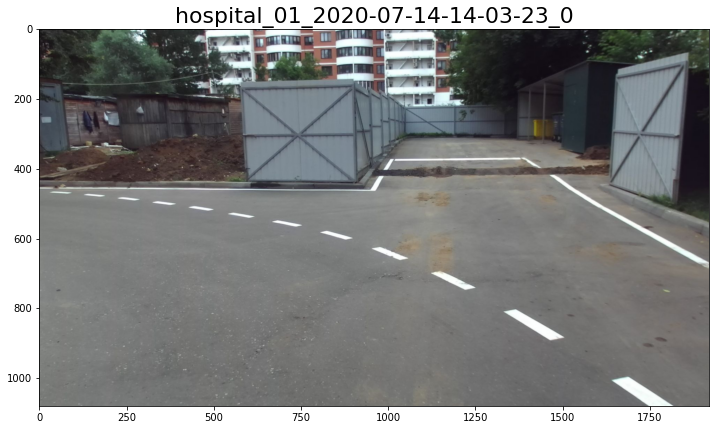

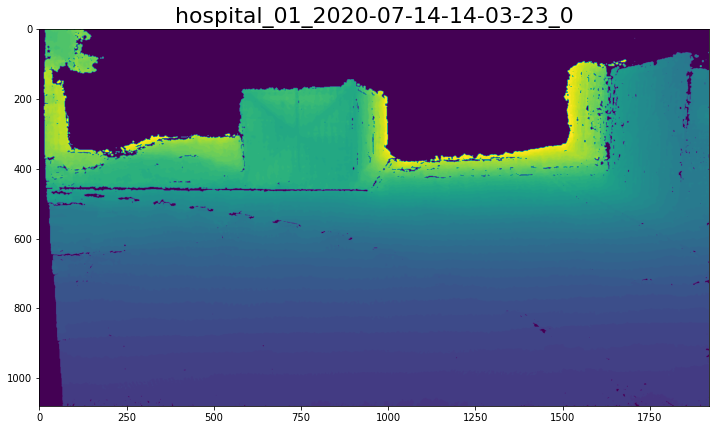

hospital_01_2020-07-14-16-59-35_0 - 122


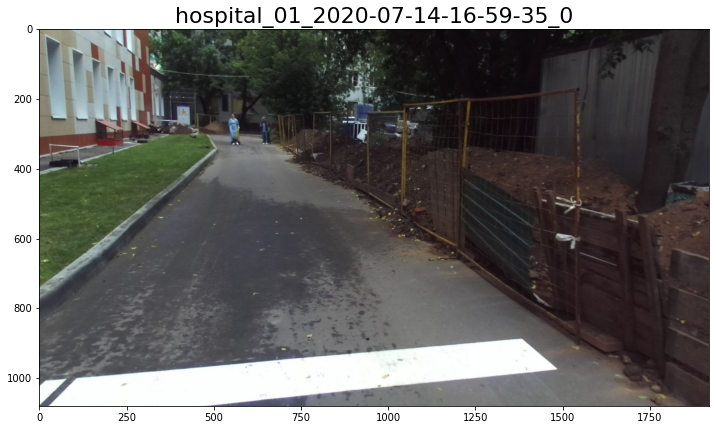

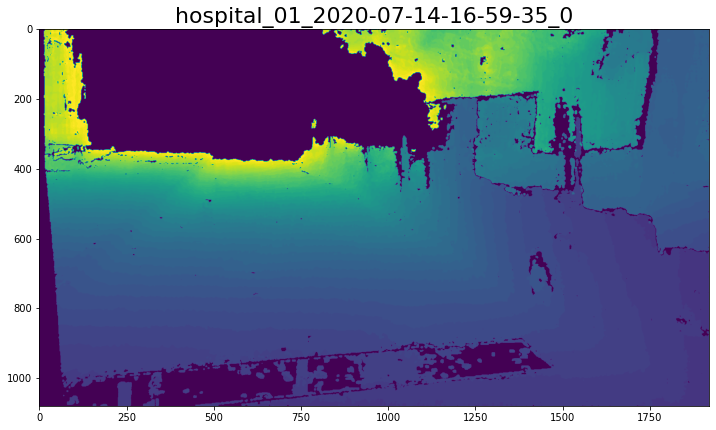

ipcp_03_2020-06-23_ipcp_2020-06-23-16-48-18_0 - 51


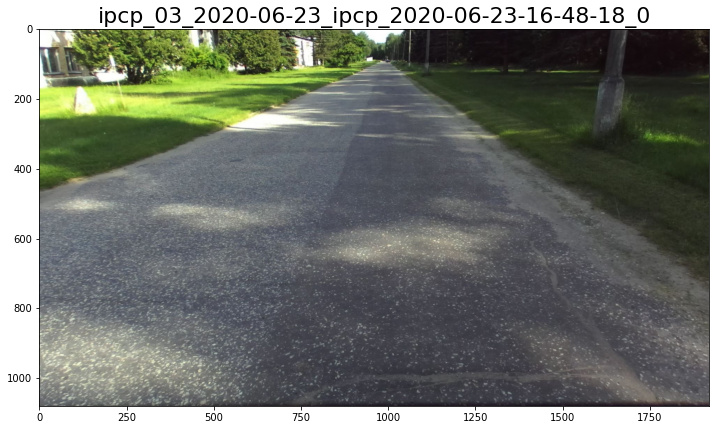

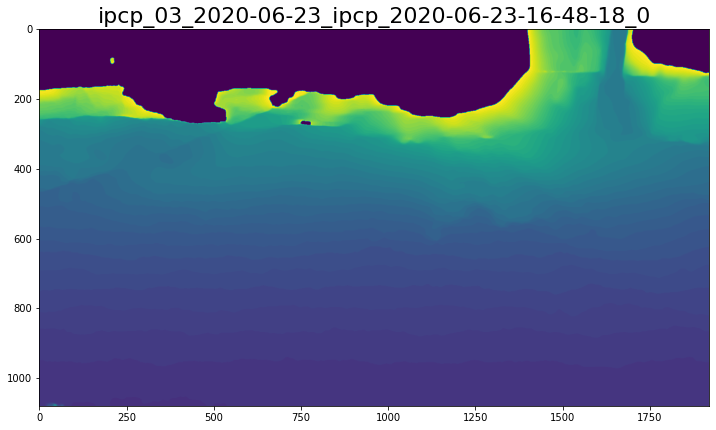

ipcp_03_2020-06-23_ipcp_ipcp_n1-03_2020-06-23-16-54-40Z_converted.evo1a_old_default - 208


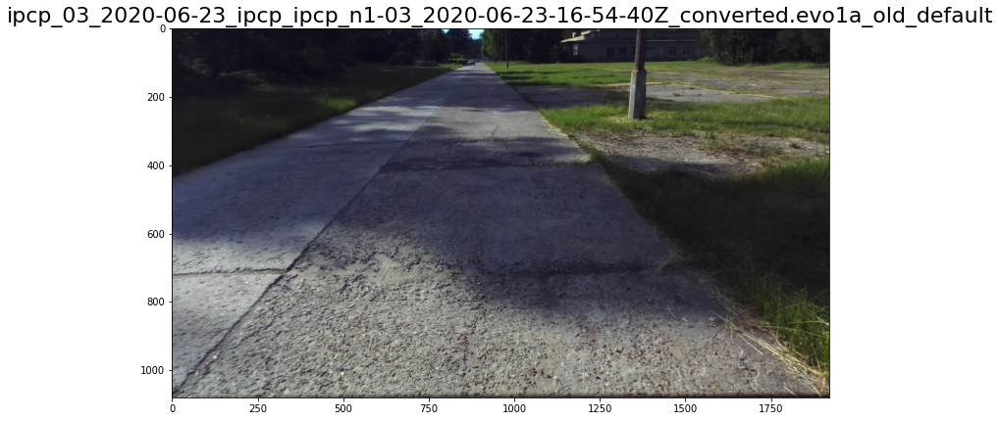

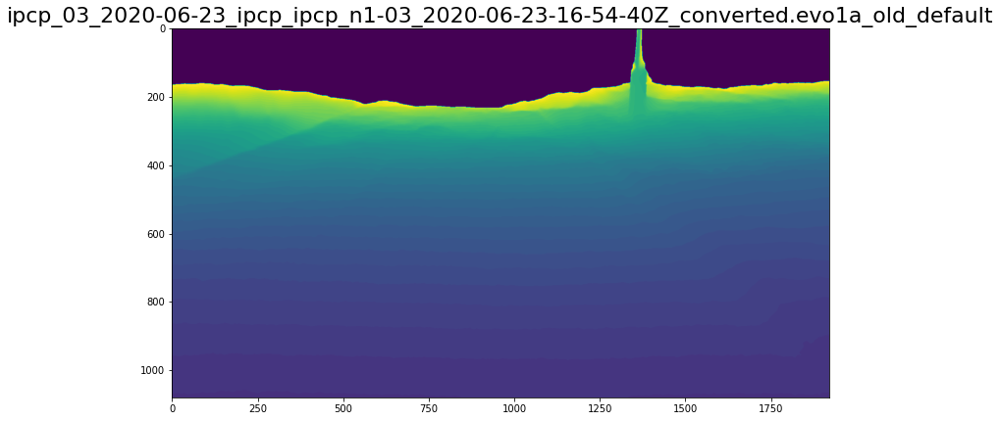

ipcp_03_2020-08-19_ipcp_2020-08-19-20-23-09_0 - 346


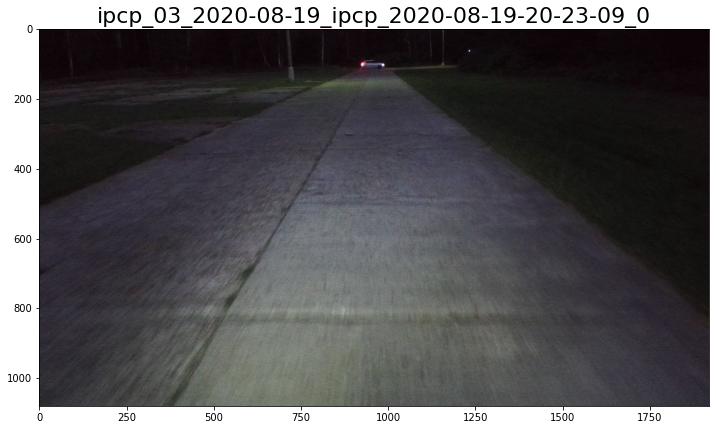

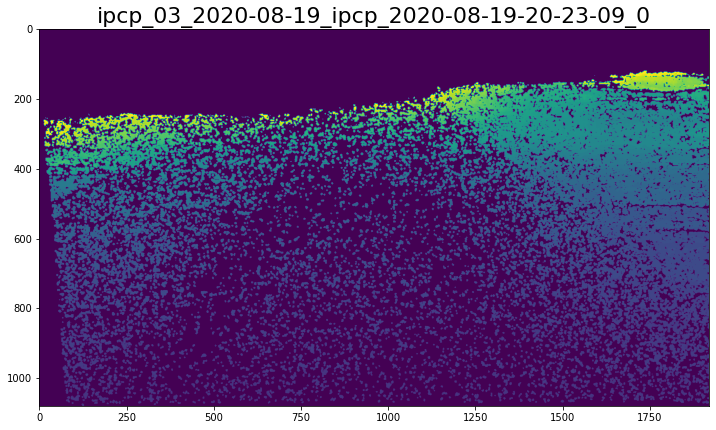

ipcp_03_2020-08-19_ipcp_ipcp_n1-03_2020-08-18-10-14-48Z_converted.evo1a_old_default - 318


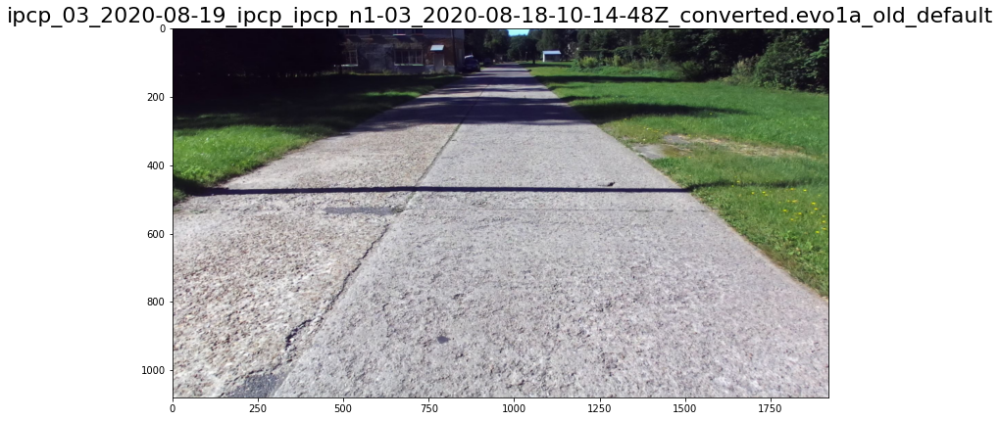

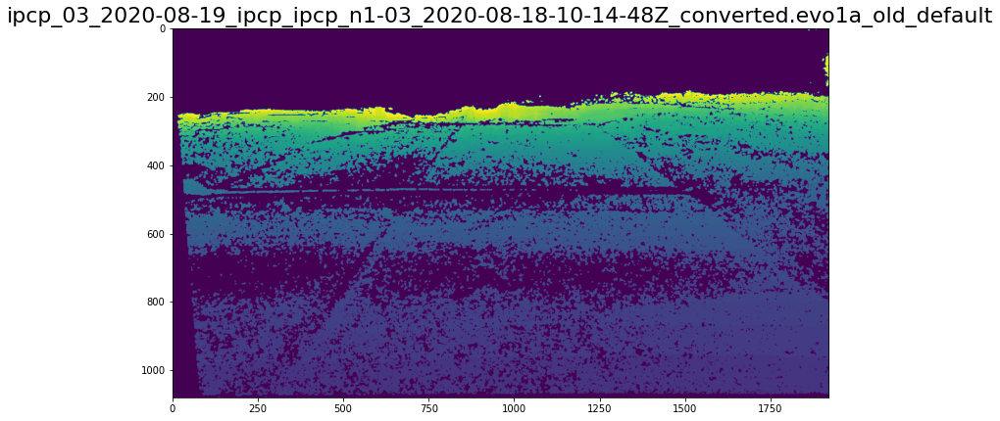

kalibr_002_2021-03-10_gnss_tests_kalibr-2_n1-002_2021-03-10-10-59-42Z_.evo1a_record_default - 159


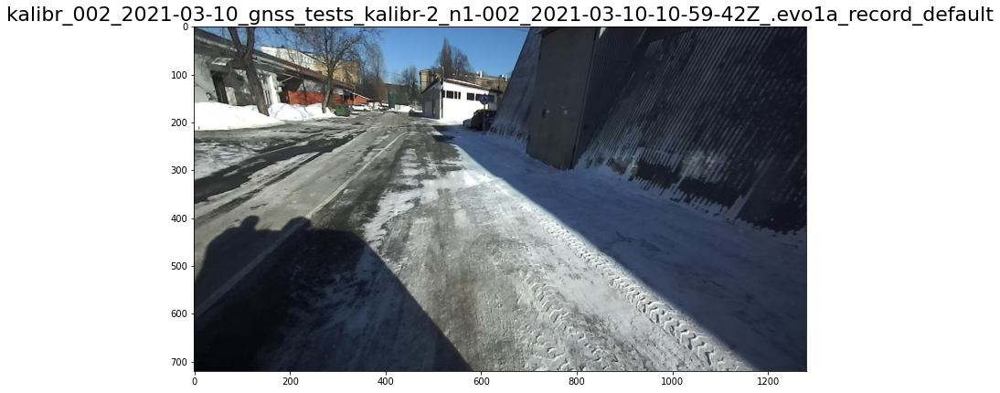

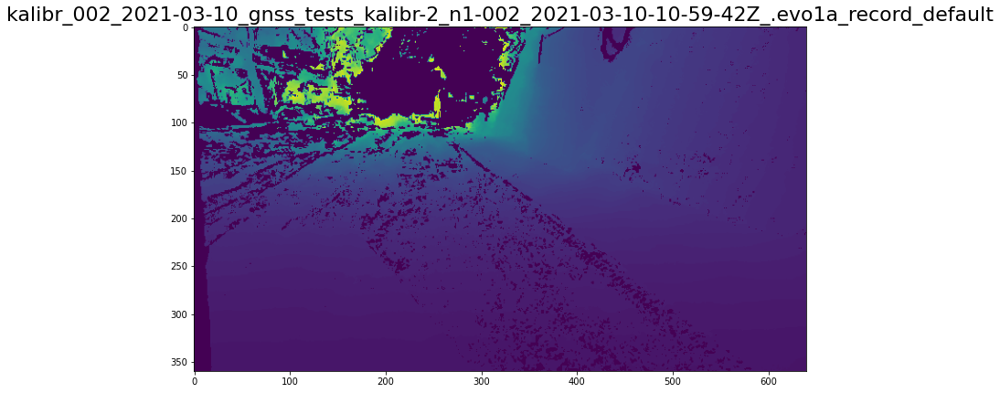

kalibr_002_kalibr-2_n1-002_2021-03-02-12-35-04Z_.evo1a_record_default - 289


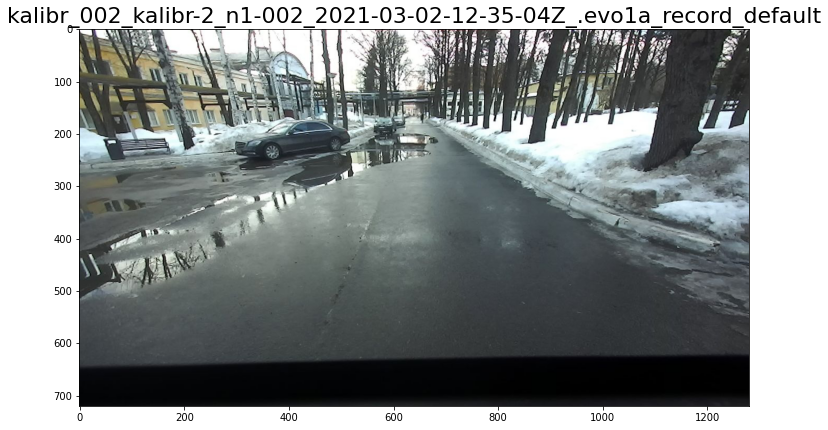

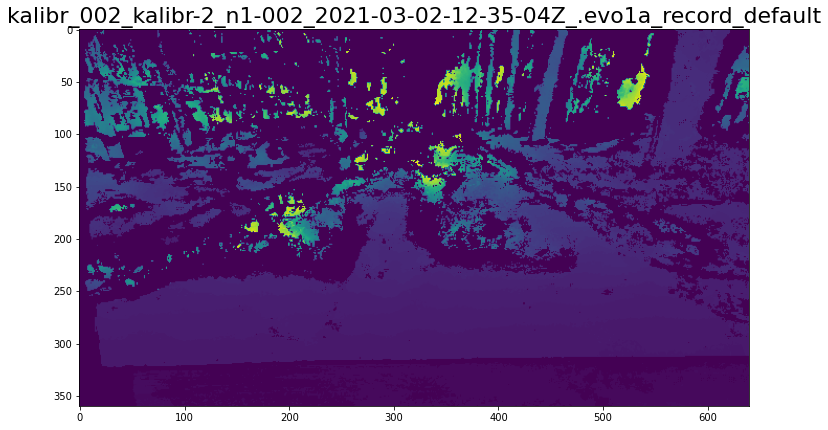

kalibr_002_kalibr-2_n1-002_2021-03-02-12-48-36Z_.evo1a_record_default - 181


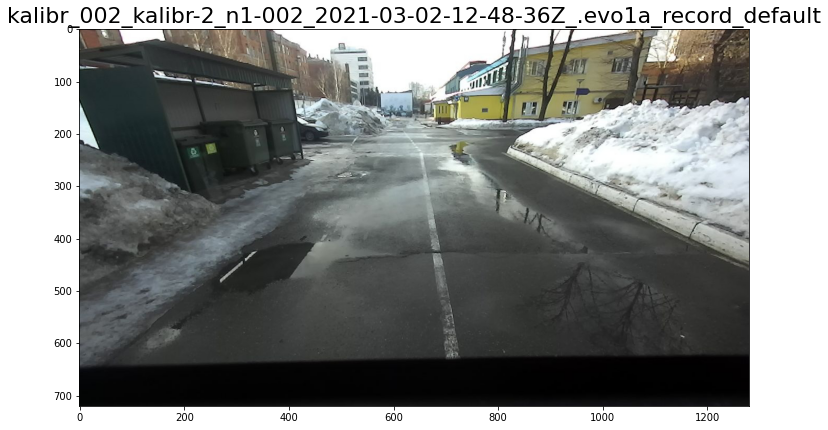

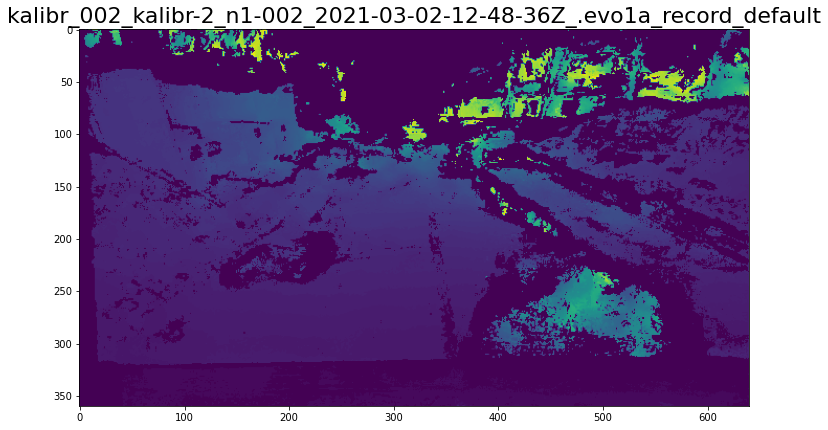

kalibr_03_2020-05-22_kalibr_2020-05-22-18-40-28_full_route_high_speed - 197


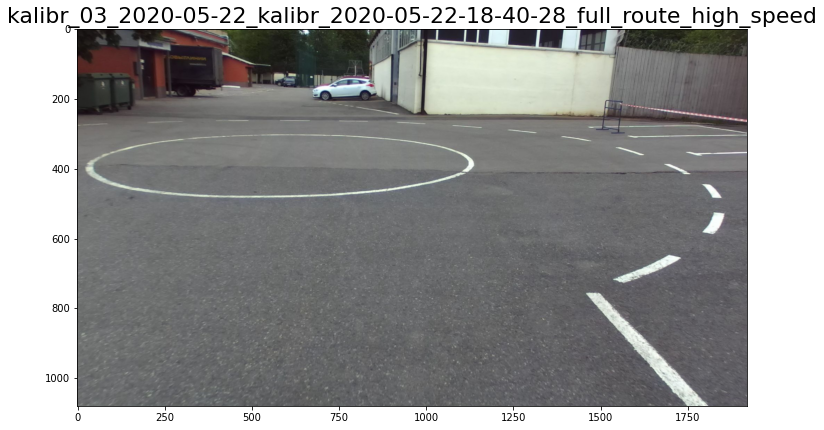

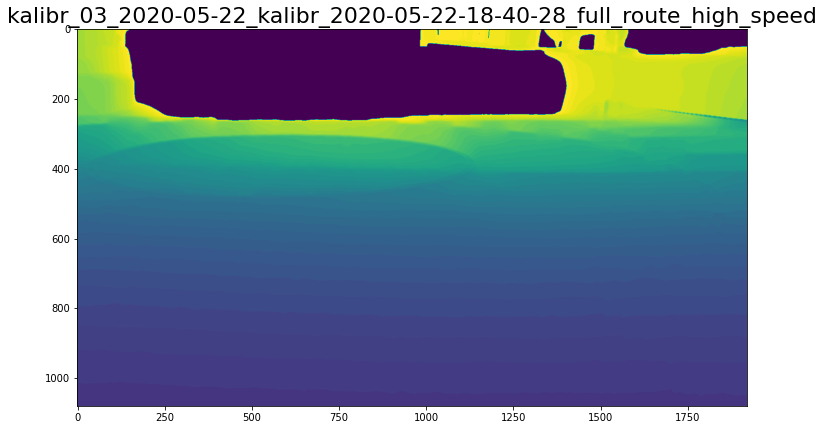

kalibr_03_2020-06-01_kalibr_2020-06-01-16-38-16_0 - 175


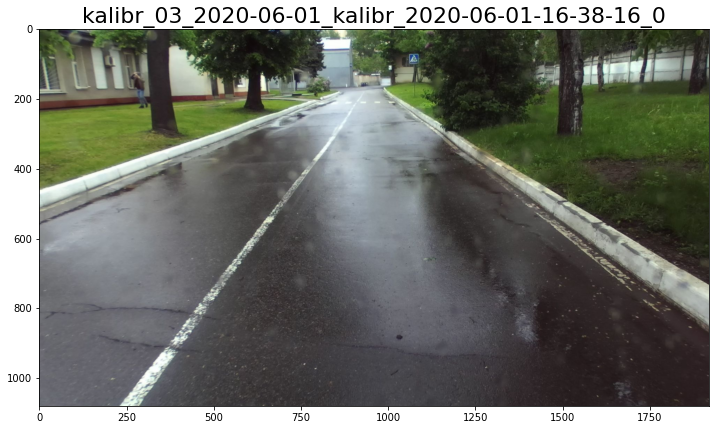

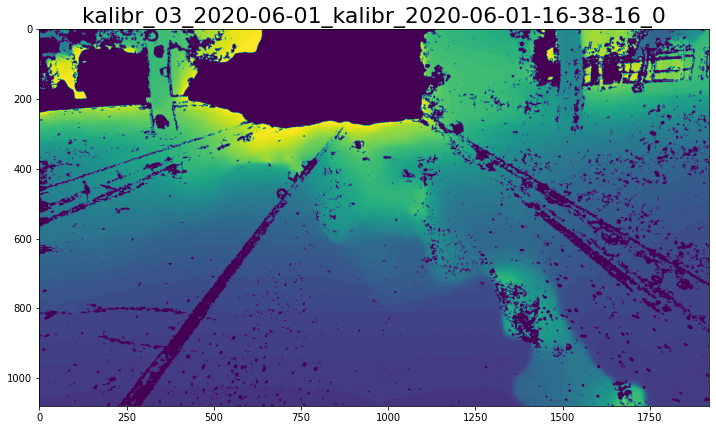

kalibr_04_2020-12-03_2020-12-03-13-26-10_0_ZED - 103


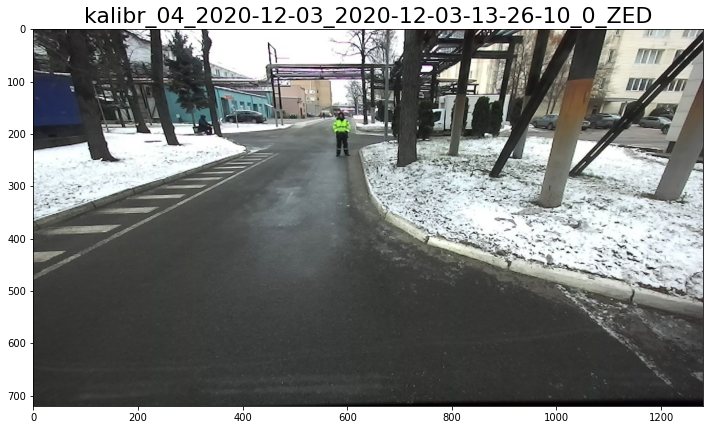

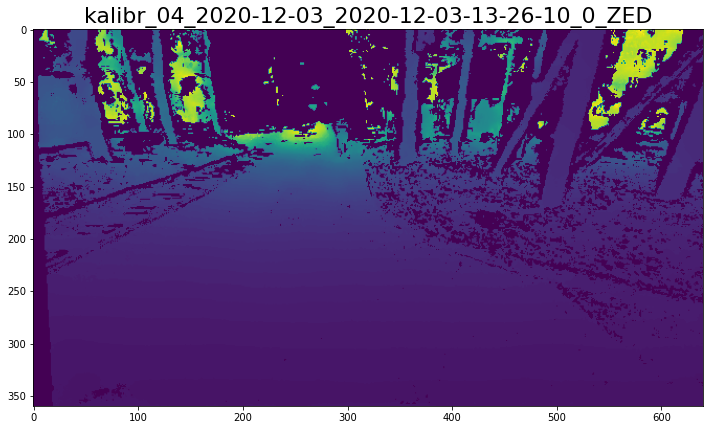

kalibr_04_2021-01-18_snow_2021-01-18-15-29-39_0 - 114


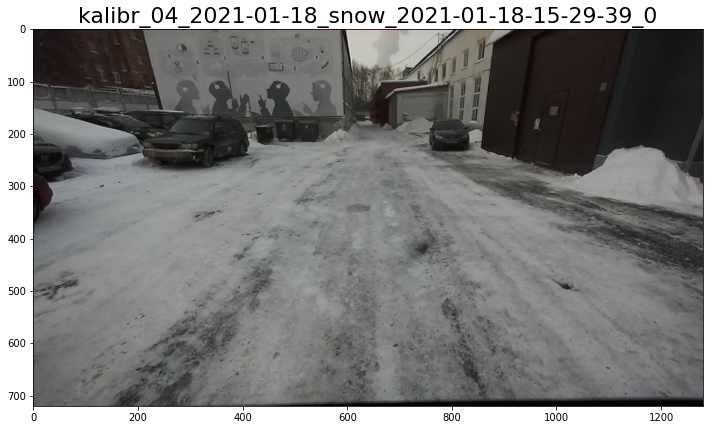

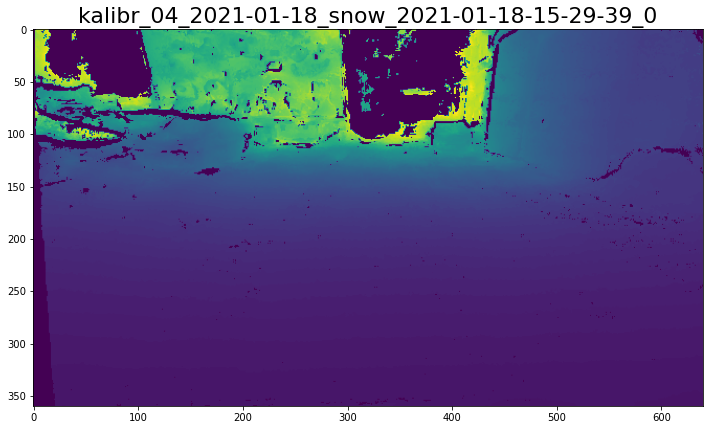

kalibr_04_2021-01-18_snow_2021-01-18-15-37-39_0 - 103


In [ ]:
scenes = data.image.str.rsplit("_", n=2, expand=True)
scenes = scenes[0].str.split("/", n=1, expand=True)[1].unique()

N_SAMPLES = 1

for scene in scenes:
    data_tmp = data[data.scene == scene]
    print(f"{scene} - {len(data_tmp)}")
    for row in data_tmp.sample(N_SAMPLES).itertuples():
        img_fname = data_path / row.image
        depth_fname = data_path / row.depth_fname
        image = Image.open(img_fname)
        depth = Image.open(depth_fname)
        plot_data(image, title=scene)
        plot_data(depth, title=scene)

In [ ]:
# import matplotlib.pyplot as plt
# from PIL import Image

# frames = [1300, 1400, 100, 500, 2200, 700, 800]

# for num in frames:
#     img_fname = data_path / data.image[num]
#     depth_fname = data_path / data.depth_fname[num]
#     image = Image.open(img_fname)
#     depth = Image.open(depth_fname)
#     plt.figure(figsize=(14, 8))
#     plt.imshow(image)
#     plt.show()
#     plt.figure(figsize=(14, 8))
#     plt.imshow(depth)
#     plt.show()

## Bad scenes

In [ ]:
bad_scenes = [
    "kalibr_002_kalibr-2_n1-002_2021-03-02-12-35-04Z_.evo1a_record_default",
    "kalibr_002_kalibr-2_n1-002_2021-03-02-12-48-36Z_.evo1a_record_default",
    "ipcp_03_2020-08-19_ipcp_ipcp_n1-03_2020-08-18-10-14-48Z_converted.evo1a_old_default",
    "kalibr_03_2020-06-01_kalibr_2020-06-01-16-38-16_0",
]

## K_maxtrces

In [ ]:
# Intrinsics matrices: (x_focal, y_focal, x_pp, y_pp)
K_maxtrces = {
    'ckad_01_ckad_2020-10-29-16-53-38_0': (
        1052.69873046875,
        1052.69873046875,
        969.119079589844,
        555.560913085938,
    ),
    'hospital_01_2020-07-14-14-03-23_0': (
        1412.705078125,
        1412.705078125,
        967.168579101562,
        543.377807617188,
    ),
    'ipcp_03_2020-06-23_ipcp_ipcp_n1-03_2020-06-23-16-54-40Z_converted.evo1a_old_default': (
        1411.85119628906,
        1411.85119628906,
        991.805480957031,
        505.537628173828,
    ),
    'ipcp_03_2020-08-19_ipcp_ipcp_n1-03_2020-08-18-10-14-48Z_converted.evo1a_old_default': (
        1418.53186035156,
        1418.53186035156,
        963.149108886719,
        525.431640625,
    ),
    'kalibr_002_2021-03-10_gnss_tests_kalibr-2_n1-002_2021-03-10-10-59-42Z_.evo1a_record_default': (
        521.493103027344,
        521.493103027344,
        630.518432617188,
        362.928863525391,
    ),
    'kalibr_002_kalibr-2_n1-002_2021-03-02-12-35-04Z_.evo1a_record_default': (
        521.493103027344,
        521.493103027344,
        630.518432617188,
        362.928863525391,
    ),
    'kalibr_002_kalibr-2_n1-002_2021-03-02-12-48-36Z_.evo1a_record_default': (
        521.493103027344,
        521.493103027344,
        630.518432617188,
        362.928863525391,
    ),
    'kalibr_03_2020-05-22_kalibr_2020-05-22-18-40-28_full_route_high_speed': (
        1410.72094726563,
        1410.72094726563,
        991.791381835938,
        505.526275634766,
    ),
    'kalibr_03_2020-06-01_kalibr_2020-06-01-16-38-16_0': (
        1411.34484863281,
        1411.34484863281,
        991.828979492188,
        505.558074951172,
    ),
    'kalibr_04_2020-12-03_2020-12-03-13-26-10_0_ZED': (
        523.876708984375,
        523.876708984375,
        647.893188476563,
        369.270965576172,
    ),
    'ckad_01_ckad_2020-10-29-17-01-56_0': (
        1052.69873046875,
        1052.69873046875,
        969.119079589844,
        555.560913085938,
    ),
    'hospital_01_2020-07-14-16-59-35_0': (
        1412.67077636719,
        1412.67077636719,
        967.1748046875,
        543.375671386719,
    ),
    'ipcp_03_2020-06-23_ipcp_2020-06-23-16-48-18_0': (
        1418.07263183594,
        1418.07263183594,
        991.793395996094,
        505.523162841797,
    ),
    'ipcp_03_2020-08-19_ipcp_2020-08-19-20-23-09_0': (
        1418.53186035156,
        1418.53186035156,
        963.149108886719,
        525.431640625,
    ),
    'kalibr_04_2021-01-18_snow_2021-01-18-15-29-39_0': (
        523.876708984375,
        523.876708984375,
        647.893188476563,
        369.270965576172,
    ),
    'kalibr_04_2021-01-18_snow_2021-01-18-15-37-39_0': (
        523.876708984375,
        523.876708984375,
        647.893188476563,
        369.270965576172,
    ),
    'kapotnya_02_2020-02-26_kapotnya_2020-02-26-15-27-06_0': (
        1409.71423339844,
        1409.71423339844,
        991.831970214844,
        505.561462402344,
    ),
    'kapotnya_02_2020-02-26_kapotnya_2020-02-26-15-09-42_0': (
        1418.07263183594,
        1418.07263183594,
        991.793395996094,
        505.523162841797,
    ),
    'kapotnya_02_2020-02-26_kapotnya_2020-02-26-15-34-18_0': (
        1409.71423339844,
        1409.71423339844,
        991.831970214844,
        505.561462402344,
    ),
    'kapotnya_02_2020-02-26_kapotnya_2020-02-26-15-42-08_0': (
        1409.71423339844,
        1409.71423339844,
        991.831970214844,
        505.561462402344,
    ),
}

## Create files for BTS

In [ ]:
scenes = data.image.str.rsplit("_", n=2, expand=True)[0].str.split("/", n=1, expand=True)[1].unique()

bts_data = []
for row in data.itertuples():
    scene = row.image.rsplit("_", maxsplit=2)[0].split("/")[1]
    bts_data.append({
        "image": row.image,
        "depth": row.depth_fname,
        "focal": K_maxtrces[scene][0],
        "split": row.split,
    })
    
splited = pd.DataFrame(bts_data)

In [ ]:
import csv

train_fname = data_path / "tmp_train.txt"
val_fname = data_path / "tmp_val.txt"
test_fname = data_path / "tmp_test.txt"
columns = ["image", "depth", "focal"]
splited[splited.split == "train"][columns].to_csv(
    train_fname,
    header=False,
    index=False,
    sep=" ",
    quoting=csv.QUOTE_NONE,
    escapechar=" ",
)
splited[splited.split == "val"][columns].to_csv(
    val_fname,
    header=False,
    index=False,
    sep=" ",
    quoting=csv.QUOTE_NONE,
    escapechar=" ",
)
splited[splited.split == "test"][columns].to_csv(
    test_fname,
    header=False,
    index=False,
    sep=" ",
    quoting=csv.QUOTE_NONE,
    escapechar=" ",
)

# Networks 

In [ ]:
errors_cols = ["network", "abs_rel", "sq_rel", "rmse", "rmse_log", "a1", "a2", "a3"]
errors_arr = []

## BTS

### Imports

In [ ]:
import sys
bts_dir = repo_dir / "networks/bts"
bts_torch_dir = bts_dir / "pytorch"
bts_pretrains_dir = bts_dir / "models"
checkpoint_path = bts_pretrains_dir / "bts_eigen_v2_pytorch_densenet121/model"
sys.path.insert(1, bts_torch_dir.as_posix())

### Options

In [ ]:
from dataclasses import dataclass
from typing import Tuple

@dataclass
class Options:
    encoder="densenet121_bts"
    data_path=data_path
    dataset="kitti"
    filenames_file=test_fname
    model_name="bts_eigen_v2_pytorch_densenet121"
    checkpoint_path=checkpoint_path
    input_height=352
    input_width=1216
    max_depth=80
    bts_size=512
    do_kb_crop=True

opt = Options()

### Load pretrains

In [ ]:
! mkdir -p {bts_pretrains_dir.as_posix()}
! wget -nc https://cogaplex-bts.s3.ap-northeast-2.amazonaws.com/bts_eigen_v2_pytorch_densenet121.zip -O {bts_pretrains_dir.as_posix() + "/bts_eigen_v2_pytorch_densenet121.zip"}
! unzip -o {bts_pretrains_dir.as_posix() + "/bts_eigen_v2_pytorch_densenet121.zip"} -d {bts_pretrains_dir.as_posix()}    

### Load model

In [ ]:
from tqdm.notebook import tqdm
from torch.autograd import Variable

from evo_dataloader import BtsDataLoader
from bts import BtsModel

def get_num_lines(file_path):
    f = open(file_path, 'r')
    lines = f.readlines()
    f.close()
    return len(lines)

dataloader = BtsDataLoader(opt, mode="test")
    
model = BtsModel(params=opt)
model = torch.nn.DataParallel(model)

checkpoint = torch.load(opt.checkpoint_path)
model.load_state_dict(checkpoint['model'])
model.eval()
model.cuda()

### Validate model

In [ ]:
test_sample = []

for row in splited[splited.split == "test"].itertuples():
    test_image = data_path / row.image
    test_depth = data_path / row.depth
    focal = row.focal
    test_sample.append((test_image, focal, test_depth))

output_directory = data_path / "bts"
output_directory.mkdir(parents=True, exist_ok=True)

In [ ]:
from torch.autograd import Variable
from torchvision import transforms

feed_height = 352
feed_width = 1216

MIN_DEPTH = 0.1
MAX_DEPTH = 80

errors = []
ratios = []

with torch.no_grad():
    for idx, (image_path, focal, depth_path) in enumerate(test_sample):
        
#         is_good_sceen = True
#         for bad_scene in bad_scenes:
#             if image_path.name.startswith(bad_scene):
#                 is_good_sceen = False
#         if not is_good_sceen:
#             continue
        
        
        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        input_image = image.resize((feed_width, feed_height), Image.LANCZOS)
        input_image = np.asarray(input_image) / 255.0
        input_image = torch.Tensor(input_image.transpose((2, 0, 1))).unsqueeze(0)

        normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        input_image = normalize(input_image)

        focal = Variable(torch.tensor([focal], dtype=torch.float64).cuda())
        input_image = Variable(input_image.cuda())
        _, _, _, _, pred_depth = model(input_image, focal)

        gt_depth = np.asarray(Image.open(depth_path))
        gt_height, gt_width = gt_depth.shape

        pred_depth = torch.nn.functional.interpolate(
            pred_depth, 
            (gt_height, gt_width), 
            mode="bilinear", 
            align_corners=False
        )
        pred_depth = pred_depth.cpu().numpy().squeeze()   
        
        depth_for_save = Image.fromarray(pred_depth).convert("L")
        depth_for_save.save(output_directory / depth_path.name)
        
        mask = np.logical_and(gt_depth > MIN_DEPTH, gt_depth < MAX_DEPTH)
        crop = np.array(
            [
                0.40810811 * gt_height, 
                0.99189189 * gt_height,
                0.03594771 * gt_width,
                0.96405229 * gt_width
            ]
        ).astype(np.int32)
        crop_mask = np.zeros(mask.shape)
        crop_mask[crop[0]:crop[1], crop[2]:crop[3]] = 1
        mask = np.logical_and(mask, crop_mask)

        pred_depth_masked = pred_depth[mask]
        gt_depth_masked = gt_depth[mask]
        ratio = np.median(gt_depth_masked) / np.median(pred_depth_masked)
        pred_depth_masked *= ratio

        pred_depth_masked[pred_depth_masked < MIN_DEPTH] = MIN_DEPTH
        pred_depth_masked[pred_depth_masked > MAX_DEPTH] = MAX_DEPTH

        errors.append(compute_errors(gt_depth_masked, pred_depth_masked))
        ratios.append(ratio)
        
#         if idx % 200 == 0:
#             plot_data(image, title="Input image")
#             plot_data(gt_depth, title="Ground truth depth")
#             plot_data(depth_resized, title="Predicted depth")

mean_errors = np.array(errors).mean(0)
errors_arr.append(["BTS"] + mean_errors.tolist())
print("\n  " + ("{:>8} | " * 7).format("abs_rel", "sq_rel", "rmse", "rmse_log", "a1", "a2", "a3"))
print(("&{: 8.3f}  " * 7).format(*mean_errors.tolist()) + "\\\\")

In [ ]:
np.array(ratios).mean()

### Profile

In [ ]:
from torch.profiler import profile, record_function, ProfilerActivity

def profile_net(model, inputs):
    with profile(activities=[
            ProfilerActivity.CUDA], record_shapes=True) as prof:
        with record_function("model_inference"):
            model(*inputs)

    print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))
    
def get_memory_usage(model, inputs):
    with profile(
        activities=[ProfilerActivity.CUDA],
        profile_memory=True,
        record_shapes=True
    ) as prof:
        model(*inputs)

    print(prof.key_averages().table(sort_by="self_cuda_memory_usage", row_limit=10))

In [ ]:
num_opt = sum([np.prod(p.size()) for p in model.parameters()])
print("Total number of parameters: {}".format(num_opt))

num_test_samples = get_num_lines(opt.filenames_file)

with open(opt.filenames_file) as f:
    lines = f.readlines()

print('now testing {} files with {}'.format(num_test_samples, opt.checkpoint_path))

start_time = time.time()
profile_data = []
with torch.no_grad():
    for num, sample in enumerate(tqdm(dataloader.data)):
        image = Variable(sample['image'].cuda())
        focal = Variable(sample['focal'].cuda())

        # warm up
        if num == 30:
            print(profile_net(model, [image, focal]))
            print(get_memory_usage(model, [image, focal]))
            break

elapsed_time = time.time() - start_time
print('Elapesed time: %s' % str(elapsed_time))
print('Done.')

### Predict depth

In [ ]:
opt.do_kb_crop = False

In [ ]:
from tqdm.notebook import tqdm
from torch.autograd import Variable

from evo_dataloader import BtsDataLoader
from bts import BtsModel

def get_num_lines(file_path):
    f = open(file_path, 'r')
    lines = f.readlines()
    f.close()
    return len(lines)

dataloader = BtsDataLoader(opt, mode="test")
    
model = BtsModel(params=opt)
model = torch.nn.DataParallel(model)

checkpoint = torch.load(opt.checkpoint_path)
model.load_state_dict(checkpoint['model'])
model.eval()
model.cuda()

In [ ]:
# num_opt = sum([np.prod(p.size()) for p in model.parameters()])
# print("Total number of parameters: {}".format(num_opt))

# num_test_samples = get_num_lines(opt.filenames_file)

# with open(opt.filenames_file) as f:
#     lines = f.readlines()

# print('now testing {} files with {}'.format(num_test_samples, opt.checkpoint_path))

# pred_depths = []
# pred_8x8s = []
# pred_4x4s = []
# pred_2x2s = []
# pred_1x1s = []

# start_time = time.time()
# profile_data = []
# with torch.no_grad():
#     for num, sample in enumerate(tqdm(dataloader.data)):
#         image = Variable(sample['image'].cuda())
#         focal = Variable(sample['focal'].cuda())
        
#         # Predict
#         lpg8x8, lpg4x4, lpg2x2, reduc1x1, depth_est = model(image, focal)
#         pred_depths.append(depth_est.cpu().numpy().squeeze())
        
#         img_fname = lines[num].split()[0]
#         plt.figure(figsize=(14, 8))
#         plt.imshow(Image.open(data_path / img_fname))
#         plt.show()
#         plt.figure(figsize=(14, 8))
#         img = image.cpu().numpy().squeeze().transpose([1, 2, 0])
#         plt.imshow(img)
#         plt.show()
# #         pred_8x8s.append(lpg8x8[0].cpu().numpy().squeeze())
# #         pred_4x4s.append(lpg4x4[0].cpu().numpy().squeeze())
# #         pred_2x2s.append(lpg2x2[0].cpu().numpy().squeeze())
# #         pred_1x1s.append(reduc1x1[0].cpu().numpy().squeeze())
#         if num > 10:
#             break

# elapsed_time = time.time() - start_time
# print('Elapesed time: %s' % str(elapsed_time))
# print('Done.')
# # cv2.imwrite(filename_pred_png, pred_depth_scaled, [cv2.IMWRITE_PNG_COMPRESSION, 0])

## Monodepth2

### Imports

In [ ]:
import sys
from pathlib import Path

repo_dir = Path().resolve() / "networks/monodepth2"
sys.path.insert(0, repo_dir.as_posix())

### Options

In [ ]:
from dataclasses import dataclass
from typing import Tuple

@dataclass
class Options:
    model_name: str = "mono+stereo_640x192"
    ext: str = "png"
    no_cuda: bool = False
    pred_metric_depth: bool = True

    # PATHS
#     data_path: str = Path().resolve() / "datasets/bags_historical"
#     log_dir: str = (repo_dir / "tmp").as_posix()
    
#     # TRAINING options
#     model_name: str = (repo_dir / "mdp").as_posix()
#     split: str = "eigen_zhou"
#     num_layers: int = 18
#     dataset: str = "kitti"
#     png: bool = False
#     height: int = 192
#     width: int = 640
#     disparity_smoothness: float = 1e-3
#     scales: Tuple = (0, 1, 2, 3, 4)
#     min_depth: float = 0.1
#     max_depth: float = 100.0
#     use_stereo: bool = False
#     frame_ids: Tuple[int] = (-1, 0, 1)

#     # OPTIMIZATION options
#     batch_size: int = 1 # 12
#     learning_rate: float = 1e4
#     num_epochs: int = 20
#     scheduler_step_size: int = 15
    
#     # SYSTEM options
#     no_cuda: bool = False
#     num_workers: int = 12
        
#     # ABLATION options
#     weights_init: str = "pretrained"
        
#      # LOADING options
#     load_weights_folder: str = repo_dir / "models/mono_640x192"
#     models_to_load: Tuple[str] = ("encoder", "depth")


opt = Options()
opt

### Load pretrains

In [ ]:
import networks
from utils import download_model_if_doesnt_exist

download_model_if_doesnt_exist(opt.model_name)

model_path = Path().resolve() / f"models/{opt.model_name}"
encoder_path = model_path / "encoder.pth"
depth_decoder_path = model_path / "depth.pth"


encoder = networks.ResnetEncoder(18, False)
loaded_dict_enc = torch.load(encoder_path, map_location=device)
feed_height = loaded_dict_enc['height']
feed_width = loaded_dict_enc['width']
filtered_dict_enc = {k: v for k, v in loaded_dict_enc.items() if k in encoder.state_dict()}
encoder.load_state_dict(filtered_dict_enc)
encoder.to(device)
encoder.eval()

depth_decoder = networks.DepthDecoder(
num_ch_enc=encoder.num_ch_enc, scales=range(4))
loaded_dict = torch.load(depth_decoder_path, map_location=device)
depth_decoder.load_state_dict(loaded_dict)
depth_decoder.to(device)
depth_decoder.eval()

### Validate model

In [ ]:
test_images = []
test_depth = []

for row in data[data.split == "test"].itertuples():
    test_images.append(data_path / row.image)
    test_depth.append(data_path / row.depth_fname)

output_directory = data_path / "monodepth2"
output_directory.mkdir(parents=True, exist_ok=True)

In [ ]:
from PIL import Image
import matplotlib as mpl
import matplotlib.cm as cm
from torchvision import transforms, datasets

from layers import disp_to_depth
from evaluate_depth import STEREO_SCALE_FACTOR

errors = []
ratios = []

with torch.no_grad():
    for idx, image_path in enumerate(test_images):
        
#         is_good_sceen = True
#         for bad_scene in bad_scenes:
#             if image_path.name.startswith(bad_scene):
#                 is_good_sceen = False
#         if not is_good_sceen:
#             continue

        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        input_image = image.resize((feed_width, feed_height), Image.LANCZOS)
        input_image = transforms.ToTensor()(input_image).unsqueeze(0)

        # PREDICTION
        input_image = input_image.to(device)
        features = encoder(input_image)
        outputs = depth_decoder(features)

        disp = outputs[("disp", 0)]
        disp_resized = torch.nn.functional.interpolate(
            disp, (original_height, original_width), mode="bilinear", align_corners=False)
        _, depth = disp_to_depth(disp, MIN_DEPTH, MAX_DEPTH)

        gt_path = test_depth[idx]
        gt_depth = np.asarray(Image.open(gt_path))
        gt_height, gt_width = gt_depth.shape

        pred_depth = STEREO_SCALE_FACTOR * depth.cpu().squeeze().numpy()
        pred_depth = cv2.resize(pred_depth, (gt_width, gt_height))
        
        depth_for_save = Image.fromarray(pred_depth).convert("L")
        depth_for_save.save(output_directory / gt_path.name)

        mask = np.logical_and(gt_depth > MIN_DEPTH, gt_depth < MAX_DEPTH)
        crop = np.array(
            [
                0.40810811 * gt_height, 
                0.99189189 * gt_height,
                0.03594771 * gt_width,
                0.96405229 * gt_width
            ]
        ).astype(np.int32)
        crop_mask = np.zeros(mask.shape)
        crop_mask[crop[0]:crop[1], crop[2]:crop[3]] = 1
        mask = np.logical_and(mask, crop_mask)

        pred_depth_masked = pred_depth[mask]
        gt_depth_masked = gt_depth[mask]
        ratio = np.median(gt_depth_masked) / np.median(pred_depth_masked)
        pred_depth_masked *= ratio

        pred_depth_masked[pred_depth_masked < MIN_DEPTH] = MIN_DEPTH
        pred_depth_masked[pred_depth_masked > MAX_DEPTH] = MAX_DEPTH

        errors.append(compute_errors(gt_depth_masked, pred_depth_masked))
        ratios.append(ratio)

mean_errors = np.array(errors).mean(0)
errors_arr.append(["MonoDepth2"] + mean_errors.tolist())
print("\n  " + ("{:>8} | " * 7).format("abs_rel", "sq_rel", "rmse", "rmse_log", "a1", "a2", "a3"))
print(("&{: 8.3f}  " * 7).format(*mean_errors.tolist()) + "\\\\")

In [ ]:
np.array(ratios).mean()

### Profile

In [ ]:
from torch.profiler import profile, record_function, ProfilerActivity

def profile_unet(encoder, decoder, inputs):
    with profile(activities=[
            ProfilerActivity.CUDA], record_shapes=True) as prof:
        with record_function("model_inference"):
            decoder(encoder(*inputs))

    print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))
    
def get_memory_usage(model, inputs):
    with profile(
        activities=[ProfilerActivity.CUDA],
        profile_memory=True,
        record_shapes=True
    ) as prof:
        model(*inputs)

    print(prof.key_averages().table(sort_by="self_cuda_memory_usage", row_limit=10))

In [ ]:
from PIL import Image
import matplotlib as mpl
import matplotlib.cm as cm
from torchvision import transforms, datasets

from layers import disp_to_depth
from evaluate_depth import STEREO_SCALE_FACTOR


with torch.no_grad():
    for idx, image_path in enumerate(test_images):


        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        input_image = image.resize((feed_width, feed_height), Image.LANCZOS)
        input_image = transforms.ToTensor()(input_image).unsqueeze(0)
        
        
        # PREDICTION
        input_image = input_image.to(device)
        features = encoder(input_image)
        outputs = depth_decoder(features)
        
        # warm up
        if idx == 30:
            print(profile_unet(encoder, depth_decoder, [input_image]))
#             print(get_memory_usage(model, [image, focal]))
            break      

###  Top predictions

In [ ]:
index_by_quality = np.argsort(np.array(errors)[:,0])

In [ ]:
ten_best_indx = index_by_quality[:10]

with torch.no_grad():
    for idx in ten_best_indx:
        image_path = test_images[idx]
        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        input_image = image.resize((feed_width, feed_height), Image.LANCZOS)
        input_image = transforms.ToTensor()(input_image).unsqueeze(0)

        input_image = input_image.to(device)
        features = encoder(input_image)
        outputs = depth_decoder(features)

        disp = outputs[("disp", 0)]
        _, depth = disp_to_depth(disp, MIN_DEPTH, MAX_DEPTH)

        gt_path = test_depth[idx]
        gt_depth = np.asarray(Image.open(gt_path))
        gt_height, gt_width = gt_depth.shape

        pred_depth = STEREO_SCALE_FACTOR * depth.cpu().squeeze().numpy()
        pred_depth = cv2.resize(pred_depth, (gt_width, gt_height))

        mask = np.logical_and(gt_depth > MIN_DEPTH, gt_depth < MAX_DEPTH)
        crop = np.array(
            [
                0.40810811 * gt_height, 
                0.99189189 * gt_height,
                0.03594771 * gt_width,
                0.96405229 * gt_width
            ]
        ).astype(np.int32)
        crop_mask = np.zeros(mask.shape)
        crop_mask[crop[0]:crop[1], crop[2]:crop[3]] = 1
        mask = np.logical_and(mask, crop_mask)

        plot_data(image, "Image")
        plot_data(gt_depth, "Ground truth")
        plot_data(pred_depth, "Predicted")
        plot_data(mask, "Mask")

### Worst predictions

In [ ]:
ten_worst_indx = index_by_quality[::-1][:10]

with torch.no_grad():
    for idx in ten_worst_indx:
        image_path = test_images[idx]
        print(image_path)
        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        input_image = image.resize((feed_width, feed_height), Image.LANCZOS)
        input_image = transforms.ToTensor()(input_image).unsqueeze(0)

        input_image = input_image.to(device)
        features = encoder(input_image)
        outputs = depth_decoder(features)

        disp = outputs[("disp", 0)]
        _, depth = disp_to_depth(disp, MIN_DEPTH, MAX_DEPTH)

        gt_path = test_depth[idx]
        gt_depth = np.asarray(Image.open(gt_path))
        gt_height, gt_width = gt_depth.shape

        pred_depth = STEREO_SCALE_FACTOR * depth.cpu().squeeze().numpy()
        pred_depth = cv2.resize(pred_depth, (gt_width, gt_height))

        mask = np.logical_and(gt_depth > MIN_DEPTH, gt_depth < MAX_DEPTH)
        crop = np.array(
            [
                0.40810811 * gt_height, 
                0.99189189 * gt_height,
                0.03594771 * gt_width,
                0.96405229 * gt_width
            ]
        ).astype(np.int32)
        crop_mask = np.zeros(mask.shape)
        crop_mask[crop[0]:crop[1], crop[2]:crop[3]] = 1
        mask = np.logical_and(mask, crop_mask)

        plot_data(image, "Image")
        plot_data(gt_depth, "Ground truth")
        plot_data(pred_depth, "Predicted")
        plot_data(mask, "Mask")

##  GLPDepth

In [ ]:
!pip install -q git+https://github.com/huggingface/transformers.git

### Load model

In [ ]:
from transformers import GLPNFeatureExtractor, GLPNForDepthEstimation

feature_extractor = GLPNFeatureExtractor.from_pretrained("vinvino02/glpn-kitti")
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-kitti")
model.to(device)

### Validate model

In [ ]:
output_directory = data_path / "GLPDepth"
output_directory.mkdir(parents=True, exist_ok=True)

In [ ]:
errors = []
ratios = []

with torch.no_grad():
    for idx, (image_path, focal, depth_path) in enumerate(test_sample):
        
#         is_good_sceen = True
#         for bad_scene in bad_scenes:
#             if image_path.name.startswith(bad_scene):
#                 is_good_sceen = False
#         if not is_good_sceen:
#             continue
        
        
        image = Image.open(image_path).convert("RGB")
        original_width, original_height = image.size
        inputs = feature_extractor(images=image, return_tensors="pt").to(device)
        outputs = model(**inputs)
        predicted_depth = outputs.predicted_depth

        gt_depth = np.asarray(Image.open(depth_path))
        gt_height, gt_width = gt_depth.shape
        
        depth_resized = torch.nn.functional.interpolate(
            predicted_depth.unsqueeze(1),
            size=(gt_height, gt_width),
            mode="bicubic",
            align_corners=False,
        )
        depth_resized = depth_resized.cpu().numpy().squeeze()

        depth_for_save = Image.fromarray(pred_depth).convert("L")
        depth_for_save.save(output_directory / depth_path.name)
        
        mask = np.logical_and(gt_depth > MIN_DEPTH, gt_depth < MAX_DEPTH)
        crop = np.array(
            [
                0.40810811 * gt_height, 
                0.99189189 * gt_height,
                0.03594771 * gt_width,
                0.96405229 * gt_width
            ]
        ).astype(np.int32)
        crop_mask = np.zeros(mask.shape)
        crop_mask[crop[0]:crop[1], crop[2]:crop[3]] = 1
        mask = np.logical_and(mask, crop_mask)

        pred_depth_masked = depth_resized[mask]
        gt_depth_masked = gt_depth[mask]
        ratio = np.median(gt_depth_masked) / np.median(pred_depth_masked)
        pred_depth_masked *= ratio

        pred_depth_masked[pred_depth_masked < MIN_DEPTH] = MIN_DEPTH
        pred_depth_masked[pred_depth_masked > MAX_DEPTH] = MAX_DEPTH

        errors.append(compute_errors(gt_depth_masked, pred_depth_masked))
        ratios.append(ratio)


mean_errors = np.array(errors).mean(0)
errors_arr.append(["GLPDepth"] + mean_errors.tolist())
print("\n  " + ("{:>8} | " * 7).format("abs_rel", "sq_rel", "rmse", "rmse_log", "a1", "a2", "a3"))
print(("&{: 8.3f}  " * 7).format(*mean_errors.tolist()) + "\\\\")

In [ ]:
np.array(ratios).mean()

### Profile

In [ ]:
with torch.no_grad():
    for idx, (image_path, focal, depth_path) in enumerate(test_sample):
        image = Image.open(image_path).convert("RGB")
        inputs = feature_extractor(images=image, return_tensors="pt").pixel_values.to(device)
        outputs = model(inputs)
        predicted_depth = outputs.predicted_depth

        # warm up
        if idx == 50:
            print(profile_net(model, [inputs]))
            break

# Results 

## Metrix

In [ ]:
errors_cols = ["network", "abs_rel", "sq_rel", "rmse", "rmse_log", "a1", "a2", "a3"]
final_res = pd.DataFrame(data=errors_arr, columns=errors_cols)
final_res

## Visualizing

In [ ]:
N_SAMPLES = 1
data_tmp = data[data.split == "test"]
for scene in scenes:
    data_tmp = data_tmp[data_tmp.scene == scene]
    print(f"{scene} - {len(data_tmp)}")
    for row in data_tmp.sample(N_SAMPLES).itertuples():
        img_fname = data_path / row.image
        depth_gt = data_path / row.depth_fname
        bts_fname =  data_path / f"bts/{Path(row.depth_fname).name}"
        monodepth2_fname =  data_path / f"monodepth2/{Path(row.depth_fname).name}"
        GLPDepth_fname =  data_path / f"GLPDepth/{Path(row.depth_fname).name}"
        
        image = Image.open(img_fname)
        depth_gt = Image.open(depth_fname)
        bts = Image.open(bts_fname)
        monodepth2 = Image.open(monodepth2_fname)
        GLPDepth = Image.open(GLPDepth_fname)
        
        plot_data(image, title=scene)
        plot_data(depth, title=scene)
        plot_data(bts, title="bts")
        plot_data(monodepth2, title="monodepth2")
        plot_data(GLPDepth, title="GLPDepth")